# Uber pickups

Uber a besoin de définirs les zones `chaudes` de NYC, par heure, pour que les clients attendent le moins possible. 

## 1. Initialisation

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split

from tools import delete_ouliers, evaluate_clustering_combination, get_time_filtered_dbscan_centroids

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default = "png"

In [2]:
# Nombre de processeurs à utiliser avec certains classifier
n_jobs = 4

## 2. Data exploration

Statistiques basiques du dataset.

On peut voir 3 types de fichiers:

- Les fichiers `uber-raw-data...14.csv` représentant les pickups en 2014.
- Les fichiers `uber-raw-data...15.csv` représentant les pickups en 2015 où le modèle à évoluer.
- Le fichier `taxi-zone-lookup.csv` représentant les zones et quartiers. Ce fichier est lié au fichiers de 2015 avec une liaison via la colonne locationID.


In [3]:
uber_raw_sep14_df = pd.read_csv("data/2014/uber-raw-data-sep14.csv")
display(uber_raw_sep14_df)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512
...,...,...,...,...
1028131,9/30/2014 22:57:00,40.7668,-73.9845,B02764
1028132,9/30/2014 22:57:00,40.6911,-74.1773,B02764
1028133,9/30/2014 22:58:00,40.8519,-73.9319,B02764
1028134,9/30/2014 22:58:00,40.7081,-74.0066,B02764


In [4]:
uber_raw_janjune15_df = pd.read_csv("data/2015/uber-raw-data-janjune-15.csv")
display(uber_raw_janjune15_df)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90
...,...,...,...,...
14270474,B02765,2015-05-08 15:43:00,B02765,186
14270475,B02765,2015-05-08 15:43:00,B02765,263
14270476,B02765,2015-05-08 15:43:00,B02765,90
14270477,B02765,2015-05-08 15:44:00,B01899,45


In [5]:
uber_raw_taxi_zone_df = pd.read_csv("data/taxi-zone-lookup.csv")
display(uber_raw_taxi_zone_df)

,LocationID,Borough,Zone
0,1,EWR,Newark Airport
1,2,Queens,Jamaica Bay
2,3,Bronx,Allerton/Pelham Gardens
3,4,Manhattan,Alphabet City
4,5,Staten Island,Arden Heights
...,...,...,...
260,261,Manhattan,World Trade Center
261,262,Manhattan,Yorkville East
262,263,Manhattan,Yorkville West
263,264,Unknown,Unknown


Nous allons nous concentrer sur le dataset de septembre 2014.

In [6]:
# Basic stats
print("Taille du dataset:")
print("Number of rows : {}".format(uber_raw_sep14_df.shape[0]))
print("Number of columns : {}".format(uber_raw_sep14_df.shape[1]))
print()
print("---------------------------")
print()

print("Dataset:")
print()
display(uber_raw_sep14_df.head())
print()
print("---------------------------")

print("Basics infos:")
print()
display(uber_raw_sep14_df.info())
print()
print("---------------------------")
print()

print("Basics statistics: ")
print()
data_desc = uber_raw_sep14_df.describe(include='all')
display(data_desc)
print()
print("---------------------------")
print()

print("Unique elements by feature: ")
print()
display(uber_raw_sep14_df.nunique().sort_values())
print()
print("---------------------------")
print()

print("Percentage of missing values: ")
print()
display(100*uber_raw_sep14_df.isnull().sum()/uber_raw_sep14_df.shape[0])

Taille du dataset:
Number of rows : 1028136
Number of columns : 4

---------------------------

Dataset:



,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512



---------------------------
Basics infos:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1028136 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   Date/Time  1028136 non-null  object 
 1   Lat        1028136 non-null  float64
 2   Lon        1028136 non-null  float64
 3   Base       1028136 non-null  object 
dtypes: float64(2), object(2)
memory usage: 31.4+ MB


None


---------------------------

Basics statistics: 



,Date/Time,Lat,Lon,Base
count,1028136,1.028136e+06,1.028136e+06,1028136
unique,42907,NaN,NaN,5
top,9/13/2014 18:44:00,NaN,NaN,B02617
freq,82,NaN,NaN,377695
mean,NaN,4.073922e+01,-7.397182e+01,NaN
std,NaN,4.082861e-02,5.831413e-02,NaN
min,NaN,3.998970e+01,-7.477360e+01,NaN
25%,NaN,4.072040e+01,-7.399620e+01,NaN
50%,NaN,4.074180e+01,-7.398310e+01,NaN
75%,NaN,4.076120e+01,-7.396280e+01,NaN



---------------------------

Unique elements by feature: 



Base             5
Lat           5135
Lon           7724
Date/Time    42907
dtype: int64


---------------------------

Percentage of missing values: 



Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64

**Observations**

Le modèle semble propre, pas de valeurs nulles ni de min et max incohérent.

Il y a peut être quelques courses qui se font un peu loin dans la banlieue de New York. 

### Variables du dataset 2014:

- **Date/Time**: La dat et l'heure du `pickup`
- **Lat**: Latitude du `pickup`
- **Lon**: Longitude du `pickup`
- **Base**: La base Uber affiliée au `pickup`

#### Quartiers de New-York :

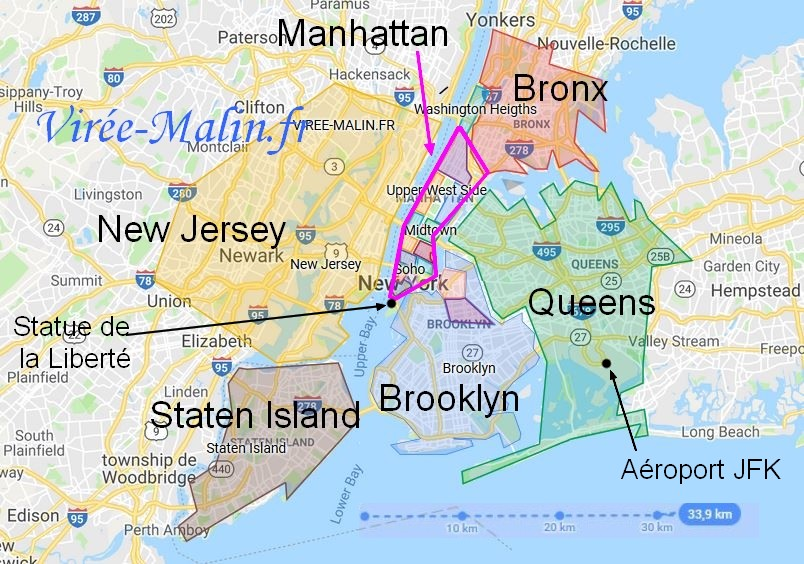

## 3. Exploratory Data Analysis

### Données de septembre 2014:

In [7]:
# Séparation de la donnée Datetime en données Année, Mois, Jour, Heure, Minute

data_sep14 = uber_raw_sep14_df

data_sep14['Datetime'] = pd.to_datetime(data_sep14['Date/Time'])

# Map des jours de la seamine
days_map = {0: 'Lundi', 1: 'Mardi', 2: 'Mercredi', 3: 'Jeudi', 4: 'Vendredi', 5: 'Samedi', 6: 'Dimanche'}


data_sep14['Year'] = data_sep14['Datetime'].dt.year
data_sep14['Month'] = data_sep14['Datetime'].dt.month
data_sep14['Day'] = data_sep14['Datetime'].dt.day
data_sep14['Hour'] = data_sep14['Datetime'].dt.hour
data_sep14['Minute'] = data_sep14['Datetime'].dt.minute
data_sep14['DayOfWeek'] = data_sep14['Datetime'].dt.day_of_week
data_sep14['DayOfWeekName'] = data_sep14['DayOfWeek'].map(days_map)

data_sep14.drop(columns=['Date/Time'], inplace=True)

data_sep14.head()

,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName
0,40.2201,-74.0021,B02512,2014-09-01 00:01:00,2014,9,1,0,1,0,Lundi
1,40.7500,-74.0027,B02512,2014-09-01 00:01:00,2014,9,1,0,1,0,Lundi
2,40.7559,-73.9864,B02512,2014-09-01 00:03:00,2014,9,1,0,3,0,Lundi
3,40.7450,-73.9889,B02512,2014-09-01 00:06:00,2014,9,1,0,6,0,Lundi
4,40.8145,-73.9444,B02512,2014-09-01 00:11:00,2014,9,1,0,11,0,Lundi


Exploration des latitudes et longitudes. Recherche des outliers.

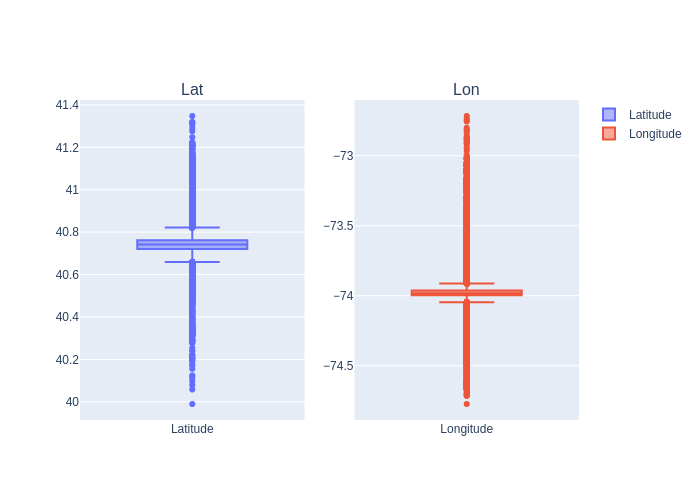

In [8]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Lat", "Lon"))

fig.add_trace(go.Box(y=data_sep14['Lat'], name='Latitude'), row=1, col=1)
fig.add_trace(go.Box(y=data_sep14['Lon'], name='Longitude'), row=1, col=2)

# Afficher la figure
fig.show()

In [9]:
# Drop lines containing invalid values or outliers  [Xˉ−3σ,Xˉ+3σ][Xˉ−3σ,Xˉ+3σ]
print("old dataset shape:", data_sep14.shape)
data_sep14 = delete_ouliers(data_sep14, columns=["Lat","Lon"], sigma=3)
print("New dataset shape:", data_sep14.shape)
data_sep14.head()

old dataset shape: (1028136, 11)
New dataset shape: (975957, 11)


,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName
1,40.7500,-74.0027,B02512,2014-09-01 00:01:00,2014,9,1,0,1,0,Lundi
2,40.7559,-73.9864,B02512,2014-09-01 00:03:00,2014,9,1,0,3,0,Lundi
3,40.7450,-73.9889,B02512,2014-09-01 00:06:00,2014,9,1,0,6,0,Lundi
4,40.8145,-73.9444,B02512,2014-09-01 00:11:00,2014,9,1,0,11,0,Lundi
5,40.6735,-73.9918,B02512,2014-09-01 00:12:00,2014,9,1,0,12,0,Lundi


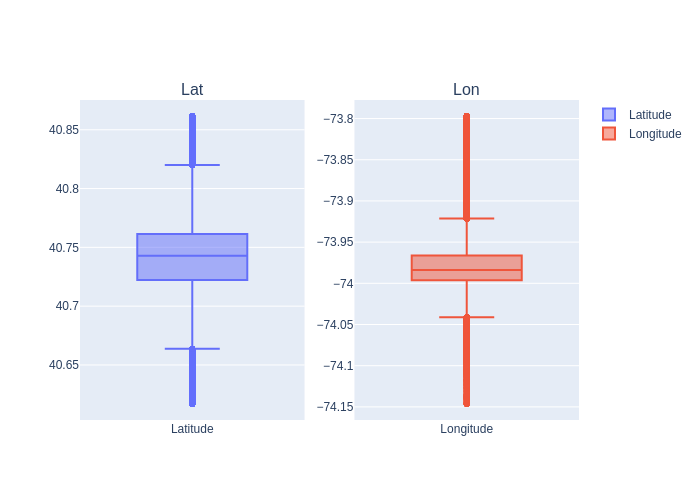

In [10]:
# Visualisation de la distribution des données et repérage des outliers
fig = make_subplots(rows=1, cols=2, subplot_titles=("Lat", "Lon"))

fig.add_trace(go.Box(y=data_sep14['Lat'], name='Latitude'), row=1, col=1)
fig.add_trace(go.Box(y=data_sep14['Lon'], name='Longitude'), row=1, col=2)

# Afficher la figure
fig.show()

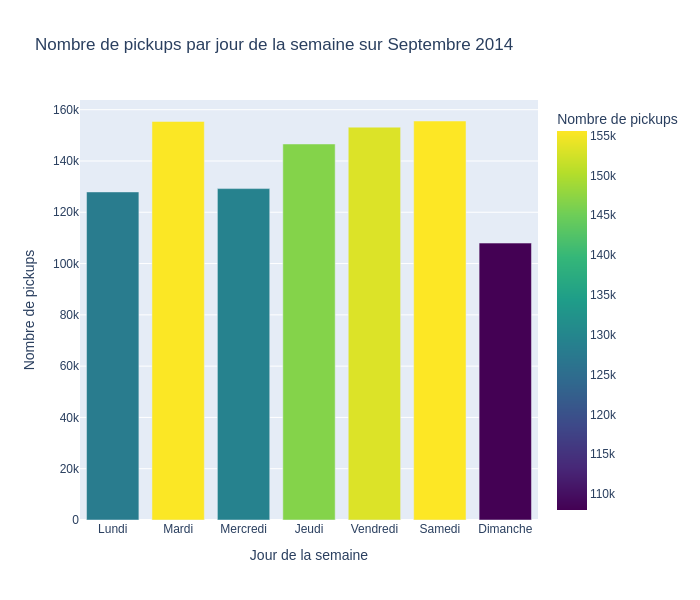

In [11]:
df_day_grouped = data_sep14.groupby('DayOfWeek').size().reset_index(name='Count')

fig = px.bar(df_day_grouped, 
            x='DayOfWeek', 
            y='Count',
            height=600,
            category_orders={'DayOfWeek': ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche']},
            title='Nombre de pickups par jour de la semaine sur Septembre 2014',
            labels={'DayOfWeek': 'Jour de la semaine', 'Count': 'Nombre de pickups'},
            color='Count',
            color_continuous_scale=px.colors.sequential.Viridis
)
fig.update_xaxes(tickvals=list(days_map.keys()), ticktext=list(days_map.values()))
fig.show()

**Observations**

Nous voyons clairement que le jour avec le moins de courses uber est le dimanche, moins de chauffeurs travaillant ce jour là et surement moins de demandes.

Il y a plus de courses le vendredi et le samedi, surement dû au fait que les gens utilisent les Uber aussi en soirée.

Il y a aussi un pic le mardi qui est peut être dû à un événement particulier (météo, fête, grève, événement culturel... ?), la raison est un peu obscur. 

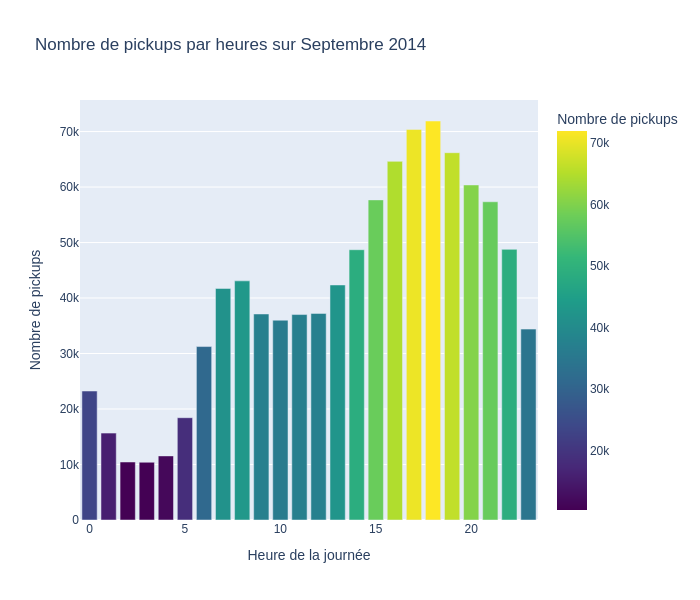

In [12]:
df_hour_grouped = data_sep14.groupby('Hour').size().reset_index(name='Count')

fig = px.bar(df_hour_grouped, 
             x='Hour', 
             y='Count',
             height=600,
             title='Nombre de pickups par heures sur Septembre 2014',
             labels={'Hour': 'Heure de la journée', 'Count': 'Nombre de pickups'},
             color='Count', 
             color_continuous_scale=px.colors.sequential.Viridis
)
fig.show()

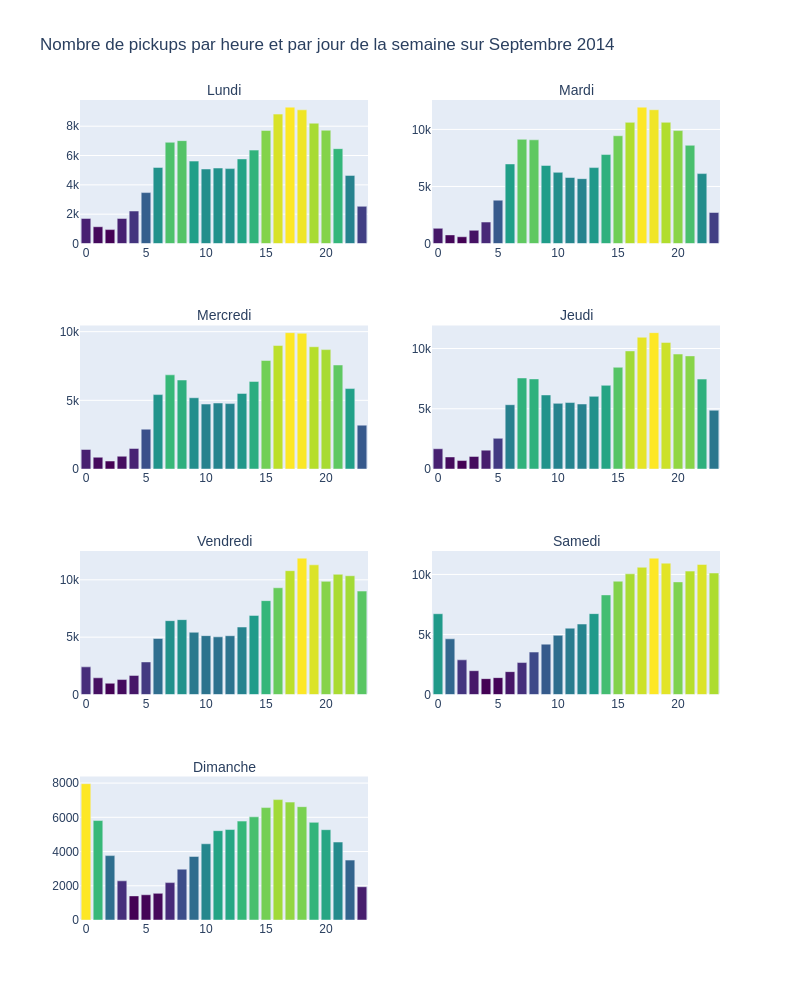

In [13]:
df_day_hour_grouped = data_sep14.groupby(['DayOfWeek', 'Hour']).size().reset_index(name='Count')
df_day_hour_grouped['DayOfWeek'] = df_day_hour_grouped['DayOfWeek'].map(days_map)

# Créer un graphique avec des sous-graphes (2 colonnes)
fig = make_subplots(
    rows=4, cols=2,  # 4 lignes, 2 colonnes
    subplot_titles=[day for day in days_map.values()],
    horizontal_spacing=0.1,  # Espace horizontal entre les sous-graphiques
    vertical_spacing=0.1,    # Espace vertical entre les sous-graphiques
)

# Ajouter les barres pour chaque jour de la semaine
for i, day in enumerate(days_map.values()):
    day_data = df_day_hour_grouped[df_day_hour_grouped['DayOfWeek'] == day]
    
    row = i // 2 + 1  # Déterminer la ligne de la facette
    col = i % 2 + 1   # Déterminer la colonne de la facette
    
    fig.add_trace(
        go.Bar(x=day_data['Hour'], y=day_data['Count'], marker=dict(color=day_data['Count'], colorscale='Viridis')),
        row=row, col=col
    )

# Mettre à jour la mise en page pour ajuster les titres et les axes
fig.update_layout(
    height=1000, width=800,  # Taille du graphique
    title_text="Nombre de pickups par heure et par jour de la semaine sur Septembre 2014",
    showlegend=False  # Masquer la légende
)

# Ajuster les titres des sous-graphiques pour les aligner
fig.update_annotations(font_size=14)

# Afficher le graphique
fig.show()

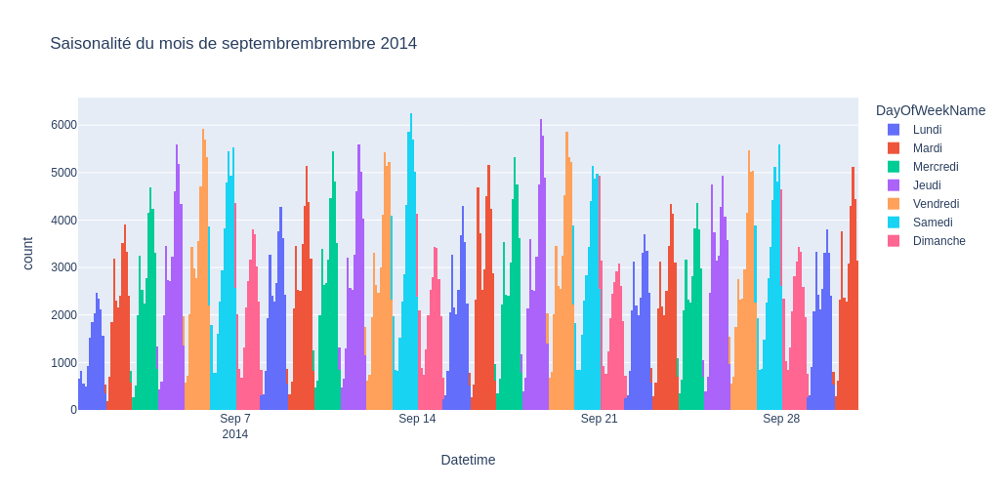

In [14]:

fig = px.histogram(data_sep14, 
                  x='Datetime', 
                  color='DayOfWeekName',
                  title="Saisonalité du mois de septembre 2014",
                  width=1024
)
                  
fig.show()

**Observations**

Nous pouvons voir qu'il y a 2 saisonnalités, une en fonction du jour de la semaine et une en fonction de l'heure.

Par exemple on voit que la journée du dimanche est la journée avec le moins de courses Uber.

Le soir il y a beaucoup moins de courses uber sauf le vendredi et le samedi, soir où les gens sortent le plus.


## 4. Training

Nous allons nous concentrer dans un premier temps sur un petit échantillon de donnée.

**Nous prendrons les données du 1er septembre 2014 à 8h.**

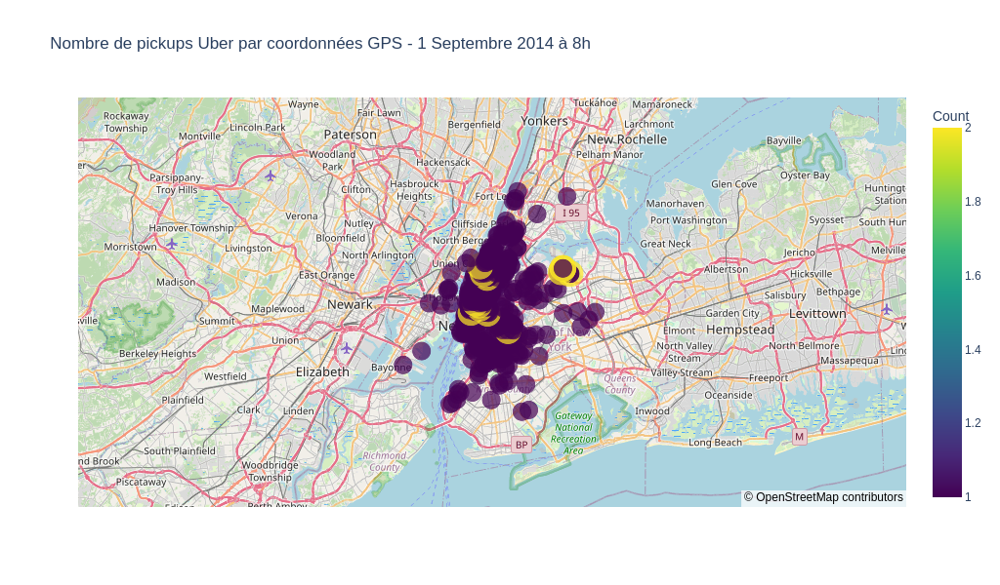

In [15]:
day1 = data_sep14[(data_sep14['Day'] == 1) & (data_sep14['Hour'] == 8)].copy()

df_gps = day1.groupby(['Lat', 'Lon']).size().reset_index(name='Count')

fig = px.scatter_mapbox(
    df_gps, 
    lat='Lat', 
    lon='Lon', 
    size='Count', 
    color='Count',
    color_continuous_scale=px.colors.sequential.Viridis,
    zoom=9,
    height=600,
    width=1024,
    mapbox_style="open-street-map",
    title='Nombre de pickups Uber par coordonnées GPS - 1 Septembre 2014 à 8h'
)

fig.show()

**Remarques:**

La normalisation n'est pas nécessaire, en effet nous allons utiliser seulement les données GPS qui sont déjà à la même échelle.

In [16]:
X_sample_hour  = day1[['Lat', 'Lon']]

### 4.1 Kmeans

In [17]:
# Instanciate KMeans 
kmeans = KMeans(n_clusters=5, random_state=42)

# Fit kmeans to our dataset
kmeans.fit(X_sample_hour)

KMeans(n_clusters=5, random_state=42)

In [18]:
kmeans.cluster_centers_

array([[ 40.72818415, -73.99779268],
       [ 40.759568  , -73.981114  ],
       [ 40.76019778, -73.88404444],
       [ 40.68827521, -73.96389658],
       [ 40.79800893, -73.95470179]])

#### Elbow

Utilisation de la méthode Elbow pour trouver le nombre optimal de clusters.

Elbow trace la somme des distances au carré entre chaque point et le centre de son cluster (inertie) en fonction du nombre de clusters. À mesure que le nombre de clusters augmente, l'inertie diminue.

Le point où la réduction de l'inertie commence à ralentir de manière significative forme un coude dans la courbe. Ce coude indique souvent le nombre optimal de clusters à utiliser.

In [19]:
wcss =  []
k = []
for i in range (2,15): 
    kmeans = KMeans(n_clusters= i)
    kmeans.fit(X_sample_hour)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))

WCSS for K=2 --> 0.9017753201477625
WCSS for K=3 --> 0.5998872066026737
WCSS for K=4 --> 0.5060086299351524
WCSS for K=5 --> 0.3384291823910441
WCSS for K=6 --> 0.27553299654276986
WCSS for K=7 --> 0.24135758277449232
WCSS for K=8 --> 0.21971851509813045
WCSS for K=9 --> 0.20724407107403459
WCSS for K=10 --> 0.1654479957682097
WCSS for K=11 --> 0.15060420865041288
WCSS for K=12 --> 0.13661906834324358
WCSS for K=13 --> 0.12447608995592932
WCSS for K=14 --> 0.11996511659330765


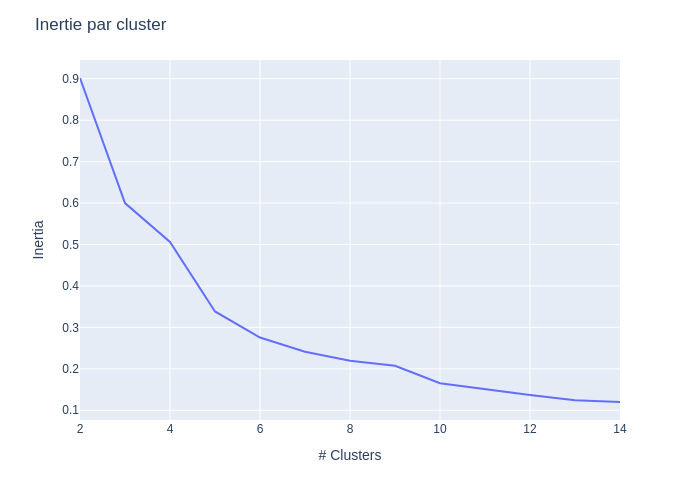

In [20]:
# Create DataFrame
wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertie par cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show() # if using workspace


#### Silhouette

La méthode de la silhouette aide à vérifier si les points de données sont bien regroupés au sein de leur cluster et bien séparés des autres clusters.

En calculant la silhouette pour tous les points et en prenant la moyenne, on obtient un score global pour l'ensemble du clustering. Ce score moyen aide à évaluer la qualité du clustering : plus la valeur est proche de 1, meilleur est le clustering.

In [21]:
# Utilisation du silhouette_score pour déterminer le nombre optimal de clusters
s_score = []
k_values = range(2,15)
for k in k_values:
    labels = KMeans(n_clusters=k, random_state = 42, n_init = 'auto').fit(X_sample_hour).labels_
    score = silhouette_score(X_sample_hour, labels)
    s_score.append(score)

In [22]:
sil = []
k = []

## Careful, you need to start at i=2 as silhouette score cannot accept less than 2 labels
for i in range (2,15):
    kmeans = KMeans(n_clusters= i, random_state = 42, n_init = 'auto')
    kmeans.fit(X_sample_hour)
    sil.append(silhouette_score(X_sample_hour, kmeans.predict(X_sample_hour)))
    k.append(i)
    print("Silhouette score for K={} is {}".format(i, sil[-1]))

Silhouette score for K=2 is 0.36751748330466016
Silhouette score for K=3 is 0.3855006847424871
Silhouette score for K=4 is 0.4111033832076032
Silhouette score for K=5 is 0.3847532185016563
Silhouette score for K=6 is 0.41825966123755076
Silhouette score for K=7 is 0.4307472329538624
Silhouette score for K=8 is 0.4145681118119052
Silhouette score for K=9 is 0.4255090906451257
Silhouette score for K=10 is 0.3796295958689531
Silhouette score for K=11 is 0.3820148728160301
Silhouette score for K=12 is 0.39377897300581177
Silhouette score for K=13 is 0.3844241035183644
Silhouette score for K=14 is 0.39288488941488664


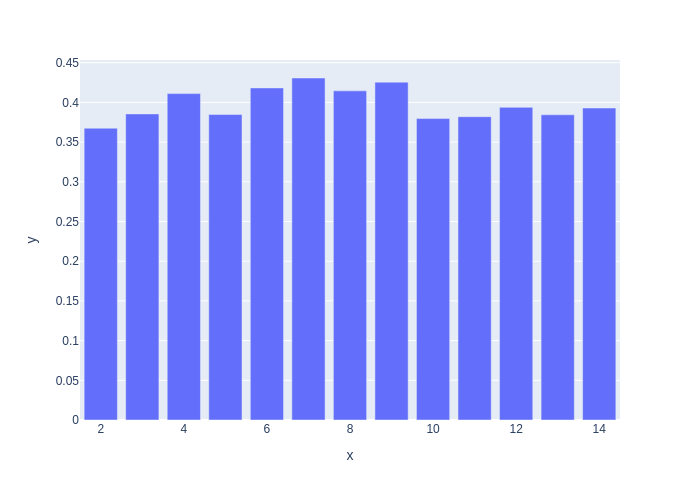

In [23]:
# Affichage de scores en fonction du nombre de clusters
fig = px.bar(x = range(2,15), y = s_score)
fig.show()

**Observations:**

Nous pouvons obeserver avec la méthode Elbow un coude se former entre 5 et 10 et la méthode silhouette à des va  leurs maximales à 7 et 9, nous allons donc prendre un de ces valeurs pour la clusterisation avec Kmeans.

In [24]:
# On ré-entraîne un KMeans avec le nombre optimal de clusters
kmeans = KMeans(n_clusters= 7)
kmeans.fit(X_sample_hour)

KMeans(n_clusters=7)

In [25]:
day1.loc[:,'ClusterKMeans'] = kmeans.predict(X_sample_hour)
day1.head()

,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName,ClusterKMeans
57,40.7739,-73.8725,B02512,2014-09-01 08:05:00,2014,9,1,8,5,0,Lundi,5
58,40.6788,-73.9586,B02512,2014-09-01 08:11:00,2014,9,1,8,11,0,Lundi,0
59,40.6897,-73.9724,B02512,2014-09-01 08:13:00,2014,9,1,8,13,0,Lundi,0
60,40.7359,-73.9838,B02512,2014-09-01 08:19:00,2014,9,1,8,19,0,Lundi,1
61,40.7312,-74.0047,B02512,2014-09-01 08:21:00,2014,9,1,8,21,0,Lundi,1


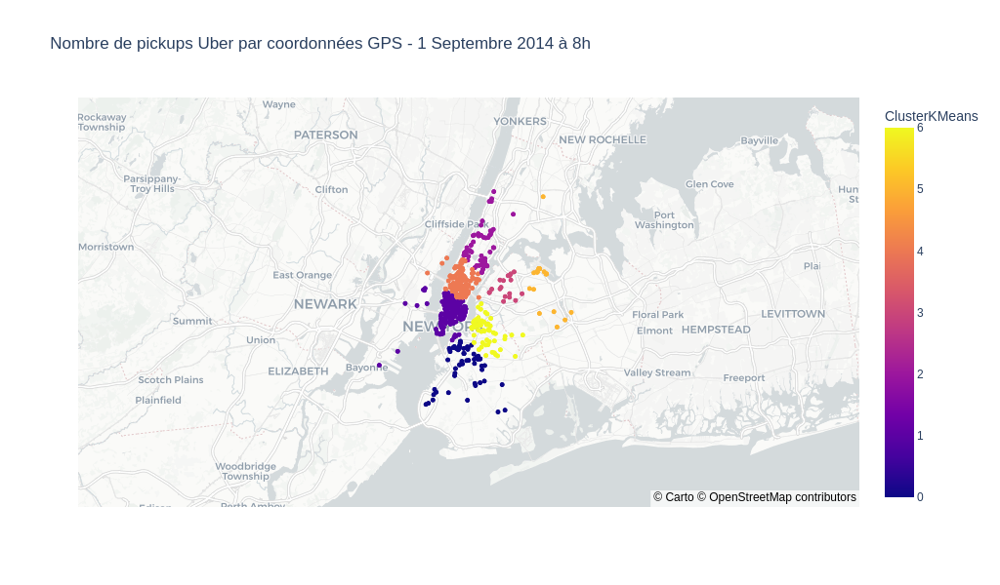

In [26]:
day1.loc[:, 'clusters'] = kmeans.labels_
day1.loc[:, 'clusters'] += 1


fig = px.scatter_mapbox(
    day1, 
    lat='Lat', 
    lon='Lon',
    color='ClusterKMeans',
    zoom=9,
    height=600,
    width=1024,
    mapbox_style="carto-positron",
    title='Nombre de pickups Uber par coordonnées GPS - 1 Septembre 2014 à 8h'
)

fig.show()

### 4.2 DBSCAN

On utilisera la distance Manhattan, plus représentative dans les grandes villes denses et où les rues sont quadrillées.

La distance Manhattan mesure la distance entre deux points dans un espace à l'aide d'une grille, en ne permettant que des mouvements horizontaux et verticaux, comme pour les déplacements des voitures dans les rues de New York.

In [27]:
# Instanciate DBSCAN
db = DBSCAN(eps=2, min_samples=5, metric="manhattan", n_jobs=n_jobs)

# Fit on data
## No need to normalize data, it already is!
db.fit(X_sample_hour)

DBSCAN(eps=2, metric='manhattan', n_jobs=4)

Comptage du nombre de clusters trouvés par DBSCAN. 

In [28]:
print(f'DBSCAN find {len(np.unique(db.labels_))} clusters: {np.unique(db.labels_)}')

DBSCAN find 1 clusters: [0]


Il y a que des outliers, il faut jouer de façon empirique avec les hyperparamètres pour trouver les clusters.

DBSCAN find 1 clusters : [0]


,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName,ClusterKMeans,clusters,cluster_dbscan
57,40.7739,-73.8725,B02512,2014-09-01 08:05:00,2014,9,1,8,5,0,Lundi,5,6,0
58,40.6788,-73.9586,B02512,2014-09-01 08:11:00,2014,9,1,8,11,0,Lundi,0,1,0
59,40.6897,-73.9724,B02512,2014-09-01 08:13:00,2014,9,1,8,13,0,Lundi,0,1,0
60,40.7359,-73.9838,B02512,2014-09-01 08:19:00,2014,9,1,8,19,0,Lundi,1,2,0
61,40.7312,-74.0047,B02512,2014-09-01 08:21:00,2014,9,1,8,21,0,Lundi,1,2,0


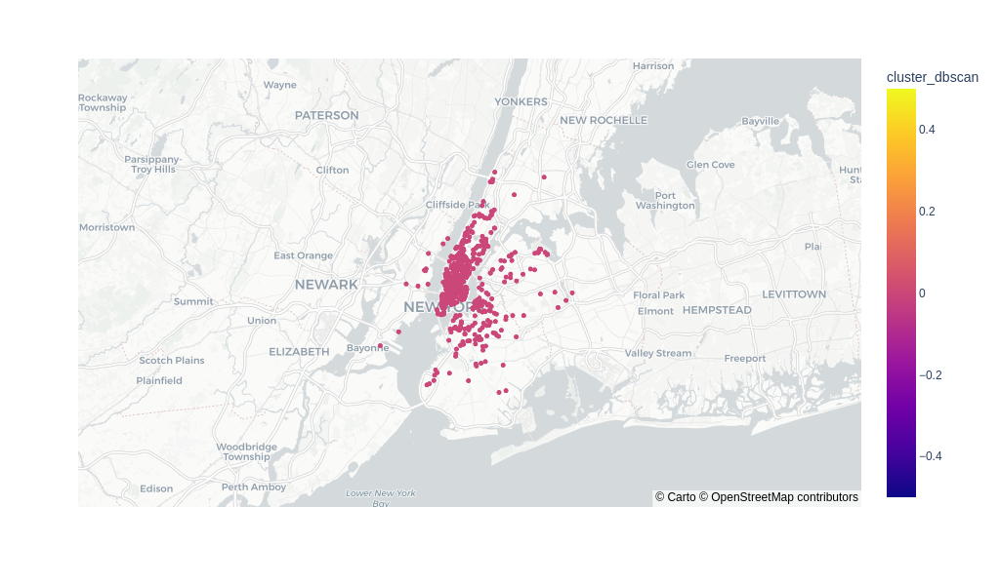

In [29]:
# Instanciate DBSCAN
db = DBSCAN(eps=1, min_samples=5, metric="manhattan", n_jobs=n_jobs)

# Fit on data
## No need to normalize data, it already is!
db.fit(X_sample_hour)
print(f'DBSCAN find {len(np.unique(db.labels_))} clusters : {np.unique(db.labels_)}')

day1['cluster_dbscan'] = db.labels_
display(day1.head())

fig = px.scatter_mapbox(
        day1[day1['cluster_dbscan'] != -1],
        lat="Lat",
        lon="Lon",
        zoom=9,
        width=1024,
        height=600,
        color="cluster_dbscan",
        mapbox_style="carto-positron"
)

fig.show()

In [30]:
day1['cluster_dbscan'].value_counts()

cluster_dbscan
0    532
Name: count, dtype: int64

**Observations:**

Cette première tentative avec DBSCAN est assez décevante. Elle n'a pas réussi à isoler plusieurs clusters mais en a trouver qu'un seul.

Il va falloir affiner les hyperparamètres pour obtenir de meilleurs résultats.

### Recherches des meilleurs hyperparamètres pour DBSCAN

Utilisation de l'algorithme des K-Nearest Neighbors (KNN) pour analyser les distances entre des points dans un ensemble de données, puis visualiser ces distances à l'aide d'un graphique.

Pour le choix de **K** on va utiliser la règle empirique de la **racine carrée √n** ou n est le nombre de point du dataset.

Cette règle n'est pas forcément optimale, mais fournit un bon point de départ pour tester d'autres valeurs de **K**.

**Rappel :**

**n_neighbors** est un paramètre utilisé dans l'algorithme des k-plus proches voisins (k-NN) pour déterminer le nombre de voisins les plus proches à considérer pour une tâche donnée, telle que la classification ou la régression.


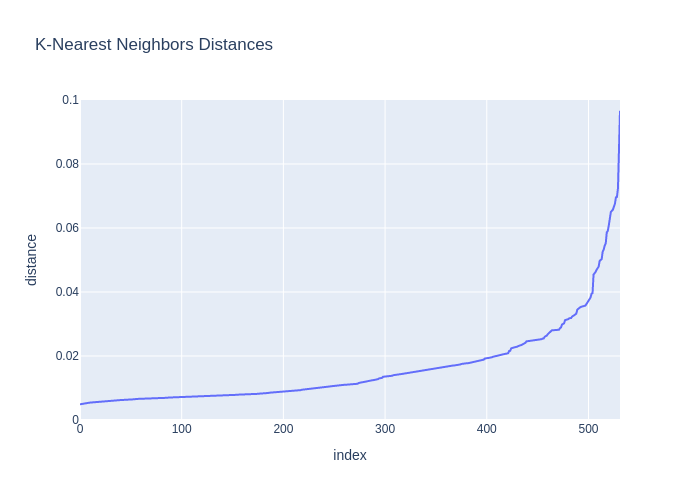

In [31]:
# Définir n_neighbors (choisissez une valeur initiale)
# On commence par définir le nombre de voisins (K) à considérer, ici fixé à n_neighbors. 
# Cela signifie qu'on va chercher les n_neighbors points les plus proches pour chaque point de l'ensemble de données.
n_neighbors = 23

# Utiliser NearestNeighbors pour trouver les distances des plus proches voisins
nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(X_sample_hour)
distances, indices = nbrs.kneighbors(X_sample_hour)

# On s'intéresse uniquement à la distance entre chaque point et son K-ième (4ème) plus proche voisin.
# On trie ces distances pour les organiser du plus petit au plus grand.
distances = np.sort(distances[:, -1])  # Trier les distances du k-ième voisin

# Créer un DataFrame pour PlotlyXGBClassifier
df = pd.DataFrame({
    'index': range(len(distances)),
    'distance': distances
})

# Créer le graphique avec Plotly Express
fig = px.line(df, x='index', y='distance', title='K-Nearest Neighbors Distances')

# Limiter l'axe y entre 0 et 1
fig.update_yaxes(range=[0, 0.1])

# Afficher le graphique
fig.show()

**Interprétation de la courbe :**

La pente n'est pas très plate au début et la courbe n'est pas très lisse, surement dû au peu de données de l'échantillon.

Le point d'inflexion sur la courbe, où la pente passe de plate à raide, est un indicateur fort pour déterminer la meilleure valeur de n_neighbors. En choisissant une valeur juste avant que la pente ne devienne raide, vous capturez la majorité des voisins proches sans inclure de points plus éloignés, souvent associés à du bruit ou à des transitions entre clusters.

#### Recherche des meilleurs hypermamètres

Utilisation de silhouette comme critères pour déterminer le meilleur score et les meilleurs paramètres epsilon et min_sample.

**Rappel :**

**min_samples** est un paramètre utilisé dans l'algorithme DBSCAN (Density-Based Spatial Clustering of Applications with Noise). Il détermine le nombre minimum de points nécessaires pour qu'un point soit considéré comme un "point central" d'un cluster.

Recherche à l'aide de silhouette des critères pour déterminer le meilleur score en fonction des paramètres epsilon et min_sample.

In [32]:
def find_best_hyperparameters():
    # Initialisation des paramètres
    min_samples = np.arange(2, 24, 2)
    print('min_samples:', min_samples)
    eps =  np.linspace(0.001, 0.06, 30)
    print('eps:', eps)

    # Liste pour stocker les futures
    output = []

    # Collecter les résultats
    for ms in min_samples:
        for ep in eps:
            result = evaluate_clustering_combination(ms=ms, ep=ep, X=X_sample_hour, min_labels=6, max_labels=10, n_jobs=n_jobs)
            output.append(result)

    return output


output = find_best_hyperparameters()

if len(output) > 0:
    filtered_output = [item for item in output if item is not None]

    best_min_samples, best_eps, best_score = sorted(filtered_output, key=lambda x: x[-1])[-1]

    # best_min_samples, best_eps, best_score = sorted(output, key=lambda x:x[-1])[-1]
    print(f"Best silhouette_score: {best_score}")
    print(f"min_samples: {best_min_samples}")
    print(f"eps: {best_eps}")

    # Sauvegarde du score en fichier csv
    now = datetime.now()
    output_df = pd.DataFrame(output)
    output_df.to_csv(f'output/silhouette_scores_small_data_{now.strftime("%Y-%m-%d-%H-%M-%S")}.csv')

min_samples: [ 2  4  6  8 10 12 14 16 18 20 22]
eps: [0.001      0.00303448 0.00506897 0.00710345 0.00913793 0.01117241
 0.0132069  0.01524138 0.01727586 0.01931034 0.02134483 0.02337931
 0.02541379 0.02744828 0.02948276 0.03151724 0.03355172 0.03558621
 0.03762069 0.03965517 0.04168966 0.04372414 0.04575862 0.0477931
 0.04982759 0.05186207 0.05389655 0.05593103 0.05796552 0.06      ]
Best silhouette_score: 0.3120309098612516
min_samples: 2
eps: 0.025413793103448275


DBSCAN find 6 clusters : [-1  0  1  2  3  4]


,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName,ClusterKMeans,clusters,cluster_dbscan
57,40.7739,-73.8725,B02512,2014-09-01 08:05:00,2014,9,1,8,5,0,Lundi,5,6,0
58,40.6788,-73.9586,B02512,2014-09-01 08:11:00,2014,9,1,8,11,0,Lundi,0,1,0
59,40.6897,-73.9724,B02512,2014-09-01 08:13:00,2014,9,1,8,13,0,Lundi,0,1,0
60,40.7359,-73.9838,B02512,2014-09-01 08:19:00,2014,9,1,8,19,0,Lundi,1,2,0
61,40.7312,-74.0047,B02512,2014-09-01 08:21:00,2014,9,1,8,21,0,Lundi,1,2,0


cluster_dbscan
 0    507
 1      7
-1      7
 3      5
 4      4
 2      2
Name: count, dtype: int64

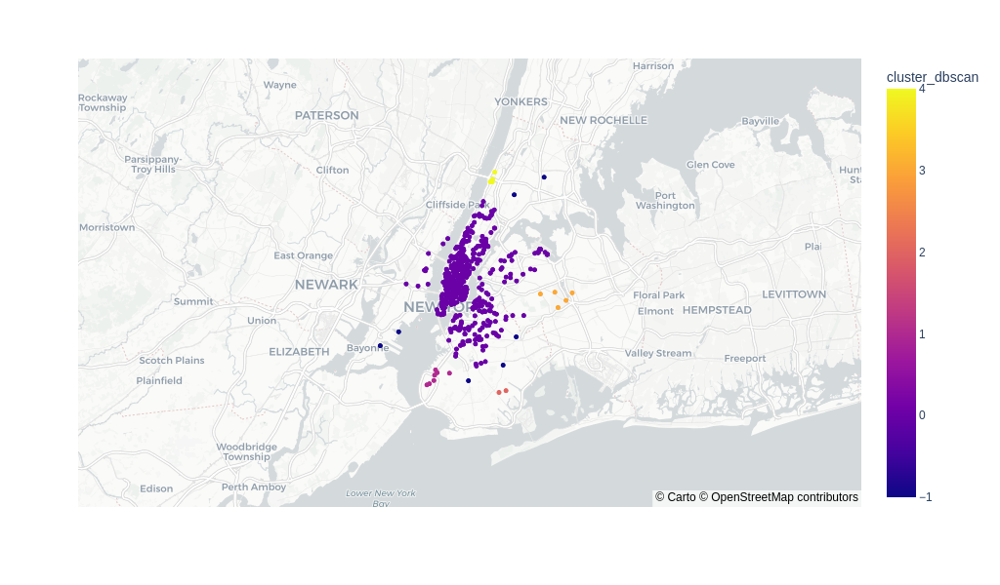

In [33]:
# Instanciate DBSCAN
db = DBSCAN(eps=0.025, min_samples=2, metric="manhattan", n_jobs=n_jobs)

# Fit on data
## No need to normalize data, it already is!
db.fit(X_sample_hour)
print(f'DBSCAN find {len(np.unique(db.labels_))} clusters : {np.unique(db.labels_)}')

day1['cluster_dbscan'] = db.labels_
display(day1.head())

display(day1['cluster_dbscan'].value_counts())

fig = px.scatter_mapbox(
        day1,
        lat="Lat",
        lon="Lon",
        zoom=9,
        width=1024,
        height=600,
        color="cluster_dbscan",
        mapbox_style="carto-positron"
)

fig.show()

**observations**

Nous allons essayer de façon empirique de baisser epsilon pour essayer de faire apparaitre un peu plus de clusters et monter min_sample pour essayer de "fractionner" les zones plus denses.

DBSCAN find 6 clusters : [-1  0  1  2  3  4]


,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName,ClusterKMeans,clusters,cluster_dbscan
57,40.7739,-73.8725,B02512,2014-09-01 08:05:00,2014,9,1,8,5,0,Lundi,5,6,0
58,40.6788,-73.9586,B02512,2014-09-01 08:11:00,2014,9,1,8,11,0,Lundi,0,1,1
59,40.6897,-73.9724,B02512,2014-09-01 08:13:00,2014,9,1,8,13,0,Lundi,0,1,1
60,40.7359,-73.9838,B02512,2014-09-01 08:19:00,2014,9,1,8,19,0,Lundi,1,2,2
61,40.7312,-74.0047,B02512,2014-09-01 08:21:00,2014,9,1,8,21,0,Lundi,1,2,2


cluster_dbscan
 2    340
 1    106
-1     50
 0     21
 3      9
 4      6
Name: count, dtype: int64

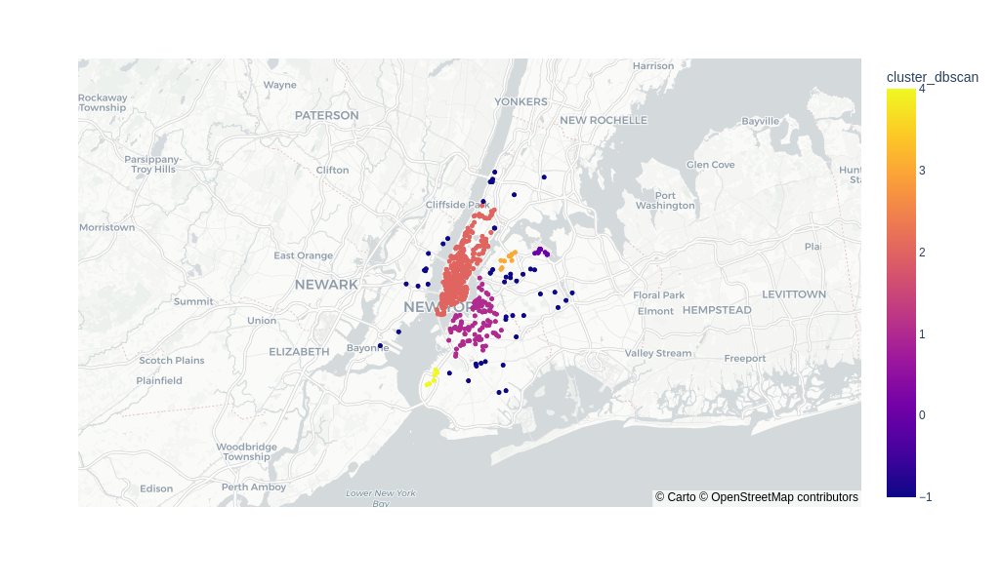

In [34]:
# Instanciate DBSCAN
db = DBSCAN(eps=0.015, min_samples=6, metric="manhattan", n_jobs=n_jobs)

db.fit(X_sample_hour)
print(f'DBSCAN find {len(np.unique(db.labels_))} clusters : {np.unique(db.labels_)}')

day1['cluster_dbscan'] = db.labels_
display(day1.head())

display(day1['cluster_dbscan'].value_counts())

fig = px.scatter_mapbox(
        day1,
        lat="Lat",
        lon="Lon",
        zoom=9,
        width=1024,
        height=600,
        color="cluster_dbscan",
        mapbox_style="carto-positron"
)

fig.show()

## 5. Ajout de plus de données

Pour des raisons de performance, nous utiliserons un échantillon des données tout en préservant la répartition sur l'heure.

### 5.1 Kmeans

In [35]:
# Taille de l'échantillon voulu
sample_size = 20000

# Utiliser train_test_split avec stratification
sep14_sample, _ = train_test_split(data_sep14, train_size=sample_size, stratify=data_sep14['Hour'], random_state=42)


In [36]:
display(sep14_sample)
display(sep14_sample.shape)

,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName
278480,40.7297,-73.9784,B02617,2014-09-01 14:02:00,2014,9,1,14,2,0,Lundi
623026,40.7221,-73.9803,B02617,2014-09-28 07:02:00,2014,9,28,7,2,6,Dimanche
929098,40.7376,-73.9803,B02764,2014-09-17 06:13:00,2014,9,17,6,13,2,Mercredi
298322,40.7509,-73.9804,B02617,2014-09-03 11:28:00,2014,9,3,11,28,2,Mercredi
861703,40.7683,-73.9823,B02764,2014-09-04 14:01:00,2014,9,4,14,1,3,Jeudi
...,...,...,...,...,...,...,...,...,...,...,...
327408,40.7174,-73.8561,B02617,2014-09-05 12:02:00,2014,9,5,12,2,4,Vendredi
94138,40.7509,-73.9845,B02598,2014-09-08 15:04:00,2014,9,8,15,4,0,Lundi
454037,40.7586,-73.9851,B02617,2014-09-14 14:23:00,2014,9,14,14,23,6,Dimanche
613813,40.7353,-73.9963,B02617,2014-09-27 16:32:00,2014,9,27,16,32,5,Samedi


(20000, 11)

In [37]:
X = sep14_sample[['Lat', 'Lon']]

#### Elbow

WCSS for K=2 --> 29.57196099912097
WCSS for K=3 --> 17.81090601332712
WCSS for K=4 --> 12.143333862188767
WCSS for K=5 --> 9.859379305083618
WCSS for K=6 --> 8.13027107908949
WCSS for K=7 --> 7.201052827643183
WCSS for K=8 --> 6.4436453093590025
WCSS for K=9 --> 5.975466778377257
WCSS for K=10 --> 5.412245879808966
WCSS for K=11 --> 4.934333652712428
WCSS for K=12 --> 4.828920869630179
WCSS for K=13 --> 4.23693999397613
WCSS for K=14 --> 4.076548310288615


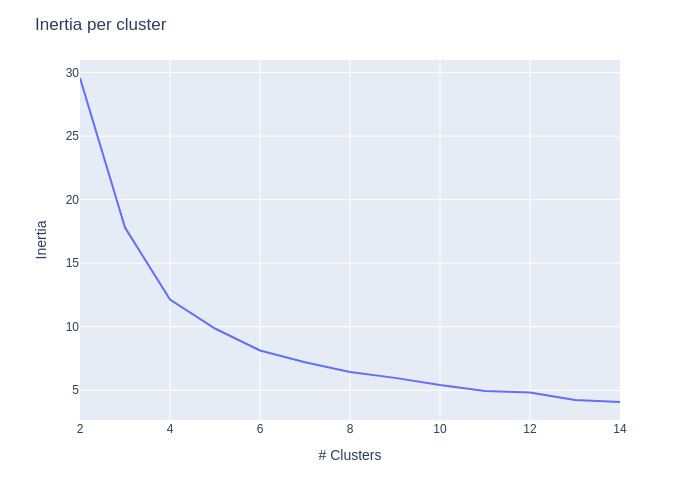

In [38]:
# Utilisation de la méthode Elbow pour trouver le nombre optimal de clusters
wcss =  []
k = []
for i in range (2,15): 
    kmeans = KMeans(n_clusters= i)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    k.append(i)
    print("WCSS for K={} --> {}".format(i, wcss[-1]))
    
    
    
# Create DataFrame
wcss_frame = pd.DataFrame(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(
    wcss_frame,
    x=k_frame,
    y=wcss_frame.iloc[:,-1]
)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show() # if using workspace

#### Silhouette

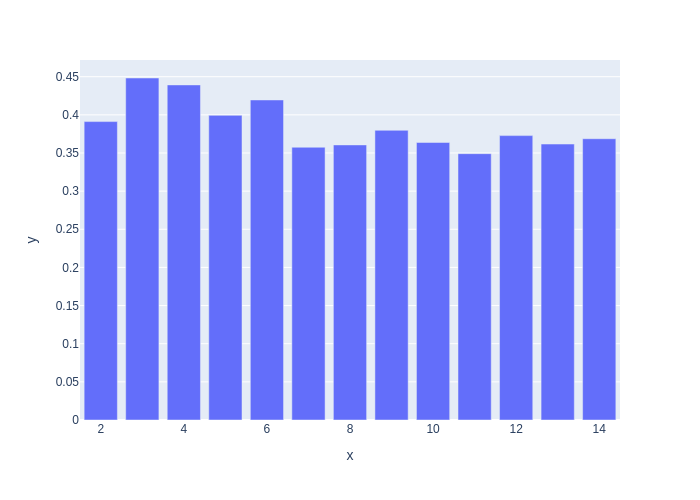

In [39]:
sil = []
k = []

## Careful, you need to start at i=2 as silhouette score cannot accept less than 2 labels
for i in range (2,15):
    kmeans = KMeans(n_clusters= i, random_state = 42)
    kmeans.fit(X)
    sil.append(silhouette_score(X, kmeans.predict(X)))
    k.append(i)

# Affichage de scores en fonction du nombre de clusters
fig = px.bar(x = range(2,15), y = sil)
fig.show()

La lecture d'Elbow et Silhouette nous donne un découpage en 6 clusters.

(array([0, 1, 2, 3, 4, 5], dtype=int32), array([7090, 2521, 1569, 6560,  812, 1448]))


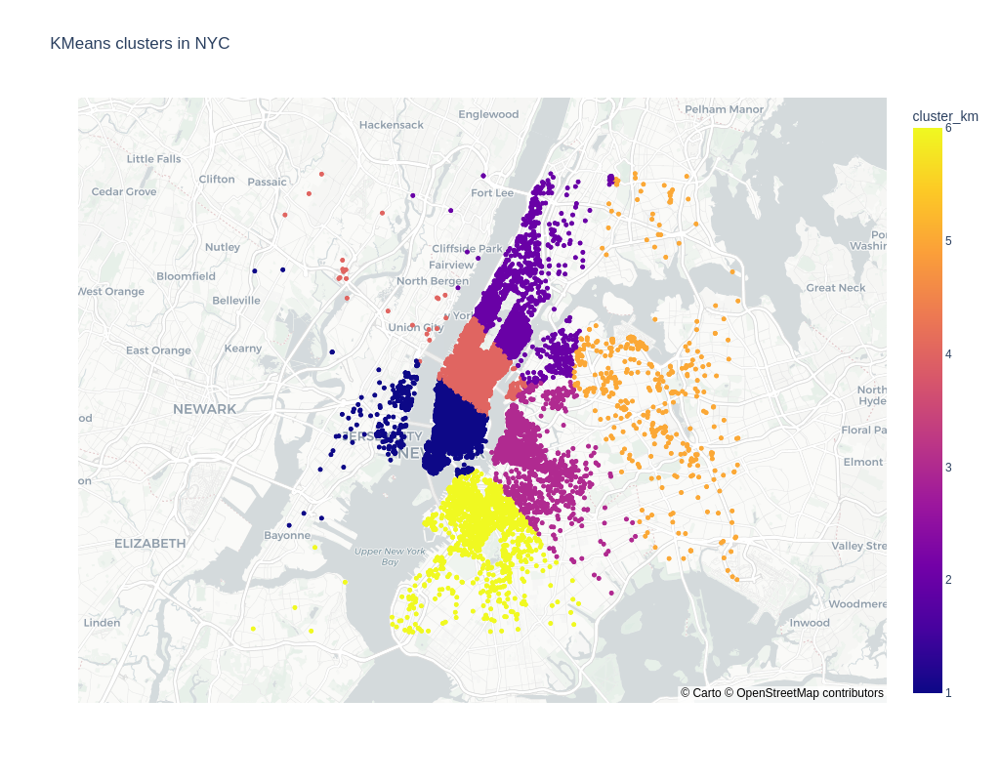

In [40]:
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(X)
print(np.unique(kmeans.labels_,return_counts=True))


sep14_sample.loc[:, 'cluster_km'] = kmeans.labels_
sep14_sample.loc[:, 'cluster_km'] += 1

fig = px.scatter_mapbox(sep14_sample,lat='Lat',lon='Lon',color='cluster_km',
                        zoom=10,mapbox_style="carto-positron",width=1024,height=800, 
                        title='KMeans clusters in NYC')
fig.show()

**Observations**

On peut observer une répartition cohérente par quartier. Manhattan est coupé en 2, puis nous avons le Bronx, Brooklin et le Queens avec son aéroport.

### 5.2 DBSCAN

Premier test du clustering à l'aide de DBSCAN.

Nous gardons pour le moment les mêmes hyperparamètres qu'avec l'échantillon précédent.

In [41]:
# Instanciate DBSCAN
db = DBSCAN(eps=0.015, min_samples=6, metric="manhattan", n_jobs=n_jobs)

# Fit on data
## No need to normalize data, it already is!
db.fit(X)

print(f'DBSCAN find {len(np.unique(db.labels_))} clusters : {np.unique(db.labels_)}')

sep14_sample.loc[:, 'cluster_dbscan'] = db.labels_
sep14_sample.loc[:, 'cluster_dbscan'] += 1 # Pour la visualisation qui ne prend pas les valeurs négatives

display(sep14_sample.head())

display(sep14_sample['cluster_dbscan'].value_counts())

DBSCAN find 11 clusters : [-1  0  1  2  3  4  5  6  7  8  9]


,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName,cluster_km,cluster_dbscan
278480,40.7297,-73.9784,B02617,2014-09-01 14:02:00,2014,9,1,14,2,0,Lundi,1,1
623026,40.7221,-73.9803,B02617,2014-09-28 07:02:00,2014,9,28,7,2,6,Dimanche,1,1
929098,40.7376,-73.9803,B02764,2014-09-17 06:13:00,2014,9,17,6,13,2,Mercredi,4,1
298322,40.7509,-73.9804,B02617,2014-09-03 11:28:00,2014,9,3,11,28,2,Mercredi,4,1
861703,40.7683,-73.9823,B02764,2014-09-04 14:01:00,2014,9,4,14,1,3,Jeudi,4,1


cluster_dbscan
1     19635
4       220
0        62
7        23
6        12
3        10
8         9
10        9
2         8
5         7
9         5
Name: count, dtype: int64

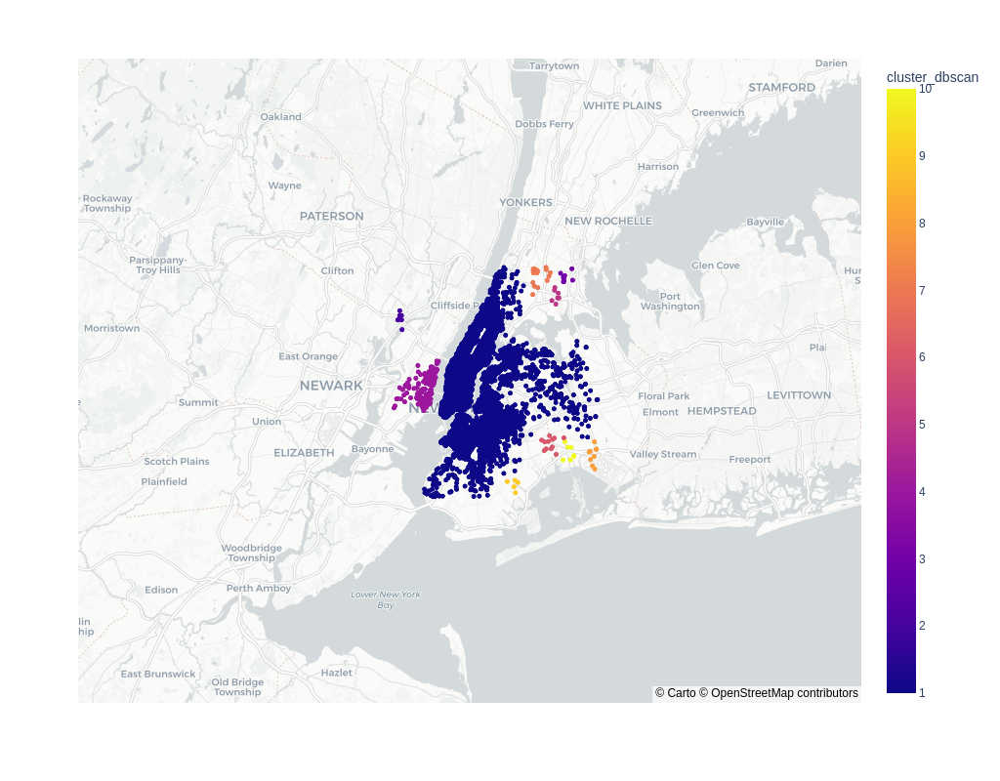

In [42]:
fig = px.scatter_mapbox(
        sep14_sample[sep14_sample['cluster_dbscan'] > 0],
        lat="Lat",
        lon="Lon",
        zoom=9,
        height=800,
        width=1024,
        color="cluster_dbscan",
        mapbox_style="carto-positron"
)

fig.show()

**Observations**

Les zones très denses comme, Manhattan, Brooklin et le Queens ont toutes étaient prises dans le même cluster.
Il va falloir trouver de meilleurs paramètres pour permètres.

#### Recherche des meilleurs hypermamètres

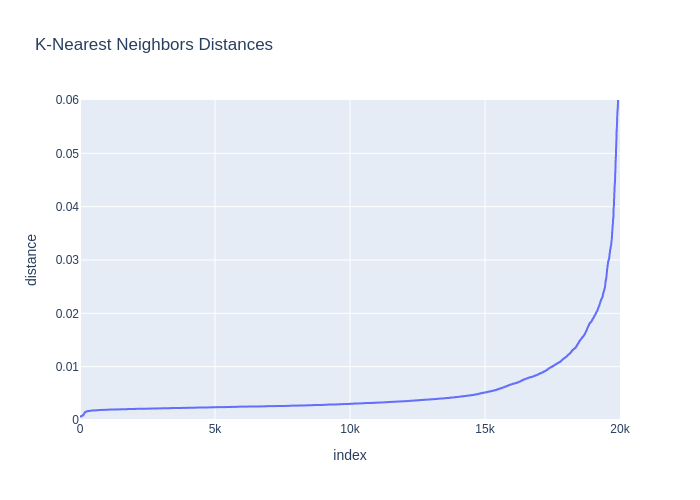

In [43]:
# Définir n_neighbors (choisissez une valeur initiale) 
n_neighbors = 140 # √(20000)

# Utiliser NearestNeighbors pour trouver les distances des plus proches voisins
nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(X)
distances, indices = nbrs.kneighbors(X)

# On s'intéresse à la distance au k-ième plus proche voisin
distances = np.sort(distances[:, -1])  # Trier les distances du k-ième voisin

# Créer un DataFrame pour PlotlyXGBClassifier
df = pd.DataFrame({
    'index': range(len(distances)),
    'distance': distances
})

# Créer le graphique avec Plotly Express
fig = px.line(df, x='index', y='distance', title='K-Nearest Neighbors Distances')

fig.update_yaxes(range=[0, 0.06])

# Afficher le graphique
fig.show()

**Interprétation de la courbe :**

Pente plate au début : La pente plate indique que pour la plupart des points de données, les n_neighbors les plus proches sont très proches les uns des autres. Cela suggère que ces points appartiennent à des clusters denses où les distances inter-points sont faibles.

Transition soudaine vers une pente raide : Ce changement indique qu'à partir d'un certain point, la distance au k-ième plus proche voisin augmente brusquement. Cela peut signifier que les points de données sont plus isolés (potentiellement des outliers ou des points de transition entre clusters).

Le point d'inflexion sur la courbe, où la pente passe de plate à raide, est un indicateur fort pour déterminer la meilleure valeur de n_neighbors. En choisissant une valeur juste avant que la pente ne devienne raide, vous capturez la majorité des voisins proches sans inclure de points plus éloignés, souvent associés à du bruit ou à des transitions entre clusters.

Pour trouver une bonne valeur pour eps, on peut utiliser l'algorithme NearestNeighbors pour estimer la distance moyenne au plus proche voisin pour chaque point dans votre dataset.

In [44]:
def find_best_hyperparameters():
    # Initialisation des paramètres
    min_samples = np.arange(2, 60, 5)
    print('min_samples:', min_samples)
    eps =  np.linspace(0.001, 0.017, 30)
    print('eps:', eps)

    # Liste pour stocker les futures
    output = []

    # Collecter les résultats
    for ms in min_samples:
        for ep in eps:
            result = evaluate_clustering_combination(ms=ms, ep=ep, X=X, min_labels=6, max_labels=12, n_jobs=n_jobs)
            output.append(result)

    return output


output = find_best_hyperparameters()

if len(output) > 0:
    filtered_output = [item for item in output if item is not None]

    best_min_samples, best_eps, best_score = sorted(filtered_output, key=lambda x: x[-1])[-1]

    # best_min_samples, best_eps, best_score = sorted(output, key=lambda x:x[-1])[-1]
    print(f"Best silhouette_score: {best_score}")
    print(f"min_samples: {best_min_samples}")
    print(f"eps: {best_eps}")

    # Sauvegarde du score en fichier csv
    now = datetime.now()
    output_df = pd.DataFrame(output)
    output_df.to_csv(f'output/silhouette_scores_small_data_{now.strftime("%Y-%m-%d-%H-%M-%S")}.csv')

min_samples: [ 2  7 12 17 22 27 32 37 42 47 52 57]
eps: [0.001      0.00155172 0.00210345 0.00265517 0.0032069  0.00375862
 0.00431034 0.00486207 0.00541379 0.00596552 0.00651724 0.00706897
 0.00762069 0.00817241 0.00872414 0.00927586 0.00982759 0.01037931
 0.01093103 0.01148276 0.01203448 0.01258621 0.01313793 0.01368966
 0.01424138 0.0147931  0.01534483 0.01589655 0.01644828 0.017     ]
Best silhouette_score: 0.46448253204152545
min_samples: 7
eps: 0.016448275862068967


In [45]:
# Instanciate DBSCAN
db = DBSCAN(eps=0.0164, min_samples=7, metric="manhattan", n_jobs=n_jobs)

# Fit on data
db.fit(X)

print(f"Number of clusters: {np.unique(db.labels_)}")
# print(f"Silhouette_score: {silhouette_score(X, labels)}")

sep14_sample.loc[:, 'cluster_dbscan'] = db.labels_
sep14_sample.loc[:, 'cluster_dbscan'] += 1 # Pour la visualisation qui ne prend pas les valeurs négatives

display(sep14_sample.head())

display(sep14_sample['cluster_dbscan'].value_counts())

Number of clusters: [-1  0  1  2  3  4  5  6  7  8]


,Lat,Lon,Base,Datetime,Year,Month,Day,Hour,Minute,DayOfWeek,DayOfWeekName,cluster_km,cluster_dbscan
278480,40.7297,-73.9784,B02617,2014-09-01 14:02:00,2014,9,1,14,2,0,Lundi,1,1
623026,40.7221,-73.9803,B02617,2014-09-28 07:02:00,2014,9,28,7,2,6,Dimanche,1,1
929098,40.7376,-73.9803,B02764,2014-09-17 06:13:00,2014,9,17,6,13,2,Mercredi,4,1
298322,40.7509,-73.9804,B02617,2014-09-03 11:28:00,2014,9,3,11,28,2,Mercredi,4,1
861703,40.7683,-73.9823,B02764,2014-09-04 14:01:00,2014,9,4,14,1,3,Jeudi,4,1


cluster_dbscan
1    19854
0       58
6       22
5       13
3       11
8       11
9        9
2        8
4        8
7        6
Name: count, dtype: int64

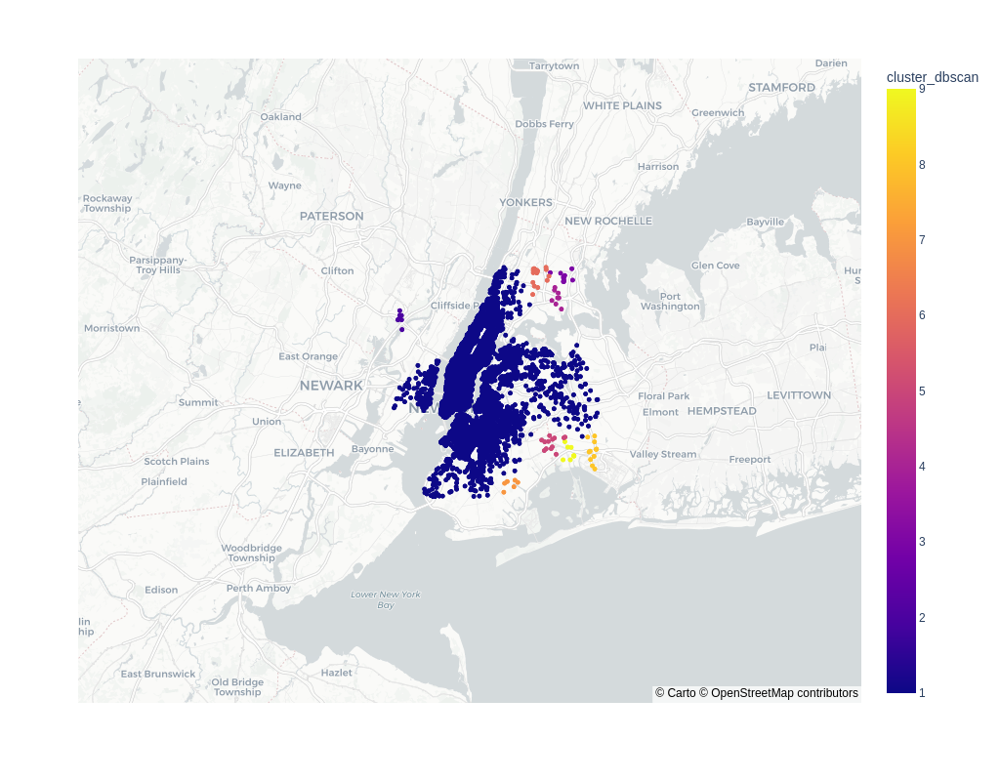

In [46]:
fig = px.scatter_mapbox(
        sep14_sample[sep14_sample['cluster_dbscan'] > 0],
        lat="Lat",
        lon="Lon",
        zoom=9,
        height=800,
        width=1024,
        color="cluster_dbscan",
        mapbox_style="carto-positron"
)

fig.show()

Ajustement des paramètres pour créer des clusters dans les zones plus denses.

Number of clusters: [-1  0  1  2  3  4  5  6  7  8]


cluster_dbscan
1    15105
0     2308
5      979
4      947
2      394
3       81
7       56
6       46
9       45
8       39
Name: count, dtype: int64

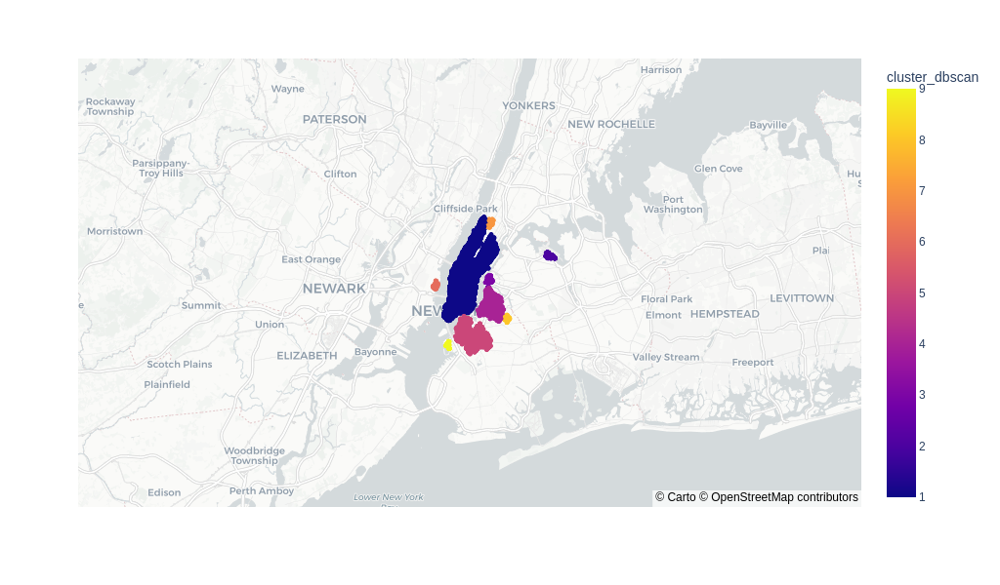

In [47]:
# Instanciate DBSCAN
db = DBSCAN(eps=0.005, min_samples=39, metric="manhattan", n_jobs=n_jobs)

# Fit on data
db.fit(X)

print(f"Number of clusters: {np.unique(db.labels_)}")

sep14_sample.loc[:, 'cluster_dbscan'] = db.labels_
sep14_sample.loc[:, 'cluster_dbscan'] += 1 # Pour la visualisation qui ne prend pas les valeurs négatives

display(sep14_sample['cluster_dbscan'].value_counts())

fig = px.scatter_mapbox(
        sep14_sample[sep14_sample['cluster_dbscan'] > 0],
        lat="Lat",
        lon="Lon",
        zoom=9,
        height=600,
        width=1024,
        color="cluster_dbscan",
        mapbox_style="carto-positron"
)

fig.show()

**Observations**

Ici les quartiers sont assez bien découpés, nous allons pouvoir passer à l'observation dans le temps de ces clusters.

## 6. Evolution dans le temps

Dans cette partie nous allons nous concentrer sur un jour de la semaine, le mercredi, et analyser les clusters heure par heure.

Nous allons observer l'évolution des courses Uber par heure pour les mercredis de septembre.

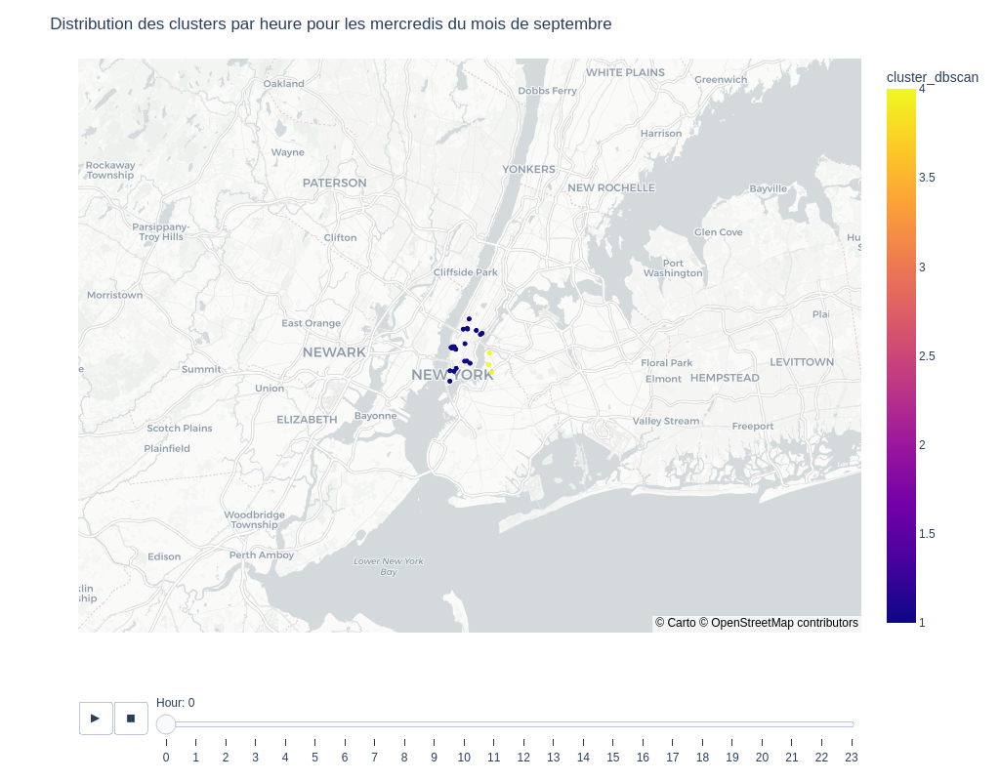

In [48]:
# Trier le DataFrame par la colonne 'Hour'
sep14_per_hour_sample = sep14_sample[(sep14_sample['DayOfWeek'] == 2) & (sep14_sample['cluster_dbscan'] > 0)].sort_values(by='Hour').reset_index(drop=True)

# Créer le graphique avec un slider pour visualiser les points par heure
fig = px.scatter_mapbox(
    sep14_per_hour_sample,
    lat="Lat",
    lon="Lon",
    color="cluster_dbscan",
    animation_frame="Hour",  # Animer par heure
    zoom=9,
    height=800,
    width=1024,
    mapbox_style="carto-positron"
)

# Ajouter le slider pour changer d'heure
fig.update_layout(
    sliders=[{
        'currentvalue': {"prefix": "Hour: "}
    }],
    title="Distribution des clusters par heure pour les mercredis du mois de septembre"
)

fig.show()

# Sauvegarde html
fig.write_html("sep14_per_hour_sample.html")

## 7. Recherche des centroïdes des clusters.

Nous allons rechercher les point centraux pour un jour et une heure donnée que l'on fera évoluer pour voir l'évolution des pickups uber au fil d'une journée.

In [55]:
# Fonction d'affichage de la carte avec les centroides
def display_map_with_centroids(data, title):
    # Afficher les points originaux et les centroïdes sur une carte
    fig = px.scatter_mapbox(
        data,  # Points originaux
        lat="Lat",
        lon="Lon",
        color="cluster_dbscan",
        animation_frame="Hour",  # Animer par heure
        zoom=10,
        height=800,
        width=1024,
        mapbox_style="carto-positron"
    )
    
    # Ajouter les centroïdes sur la même carte
    fig.add_trace(
        go.Scattermapbox(
            lat=data['Lat_centroid'],
            lon=data['Lon_centroid'],
            mode='markers',
            marker=go.scattermapbox.Marker(size=15, color='green', opacity=0.9),
            text=data['cluster_dbscan'],
            name='Centroïdes',
            showlegend=True,
            legendgroup='centroids'  # Regroupe les centroids dans une section distincte
        )
    )
    
    # Ajuster la disposition de la légende
    fig.update_layout(
        sliders=[{
            'currentvalue': {"prefix": "Hour: "}
        }],
        title=title,
        legend=dict(
            x=0.5,  
            y=-0.1,     
            bordercolor="green",
            borderwidth=0.5
        )
    )
    
    fig.show()
    

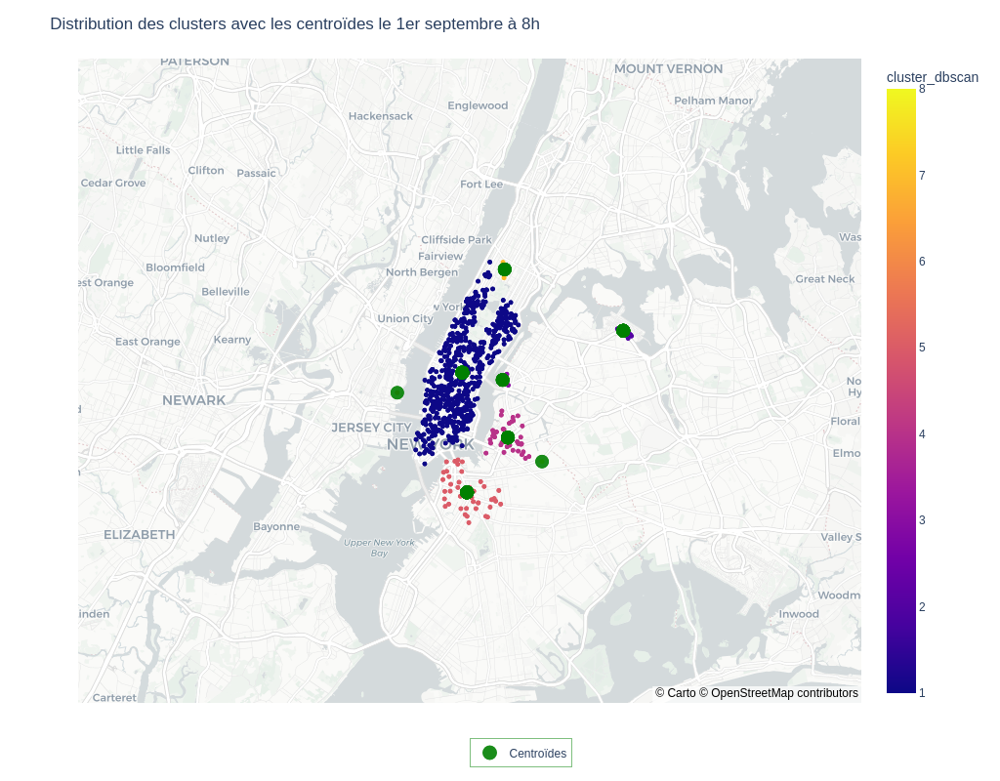

In [56]:
data_with_centroids = get_time_filtered_dbscan_centroids(sep14_sample[sep14_sample['cluster_dbscan'] > 0], 0.005, 39, 1, 8)

display_map_with_centroids(data_with_centroids, "Distribution des clusters avec les centroïdes le 1er septembre à 8h")

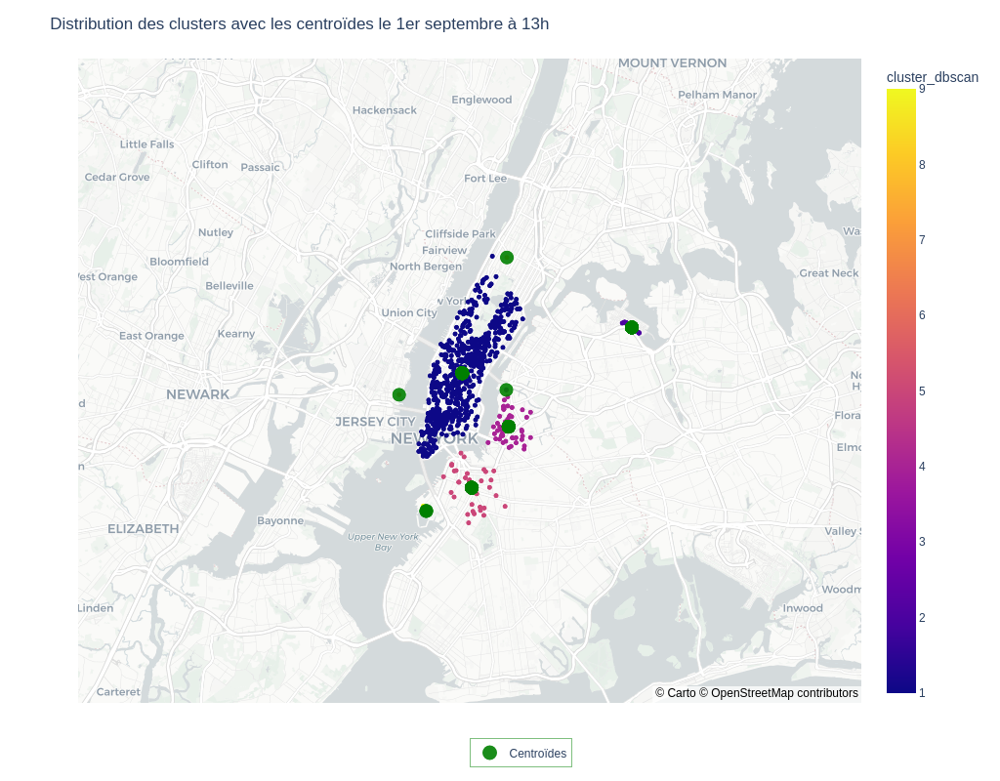

In [57]:
data_with_centroids = get_time_filtered_dbscan_centroids(sep14_sample[sep14_sample['cluster_dbscan'] > 0], 0.005, 39, 1, 13)

display_map_with_centroids(data_with_centroids, "Distribution des clusters avec les centroïdes le 1er septembre à 13h")

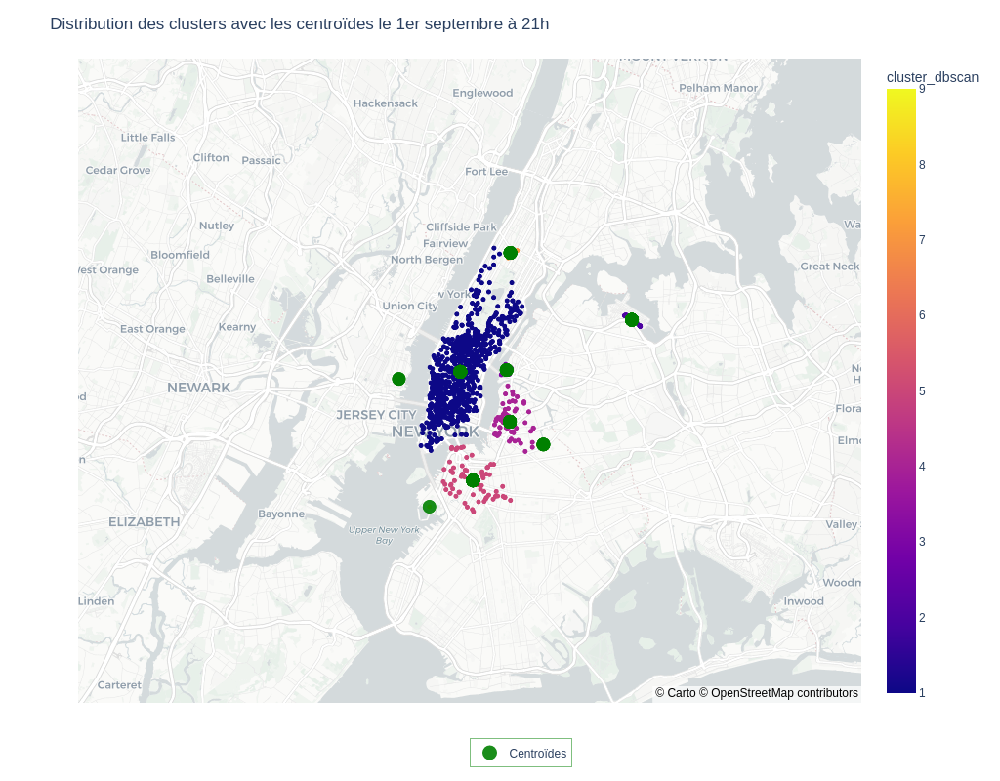

In [58]:
data_with_centroids = get_time_filtered_dbscan_centroids(sep14_sample[sep14_sample['cluster_dbscan'] > 0], 0.005, 39, 1, 21)

display_map_with_centroids(data_with_centroids, "Distribution des clusters avec les centroïdes le 1er septembre à 21h")

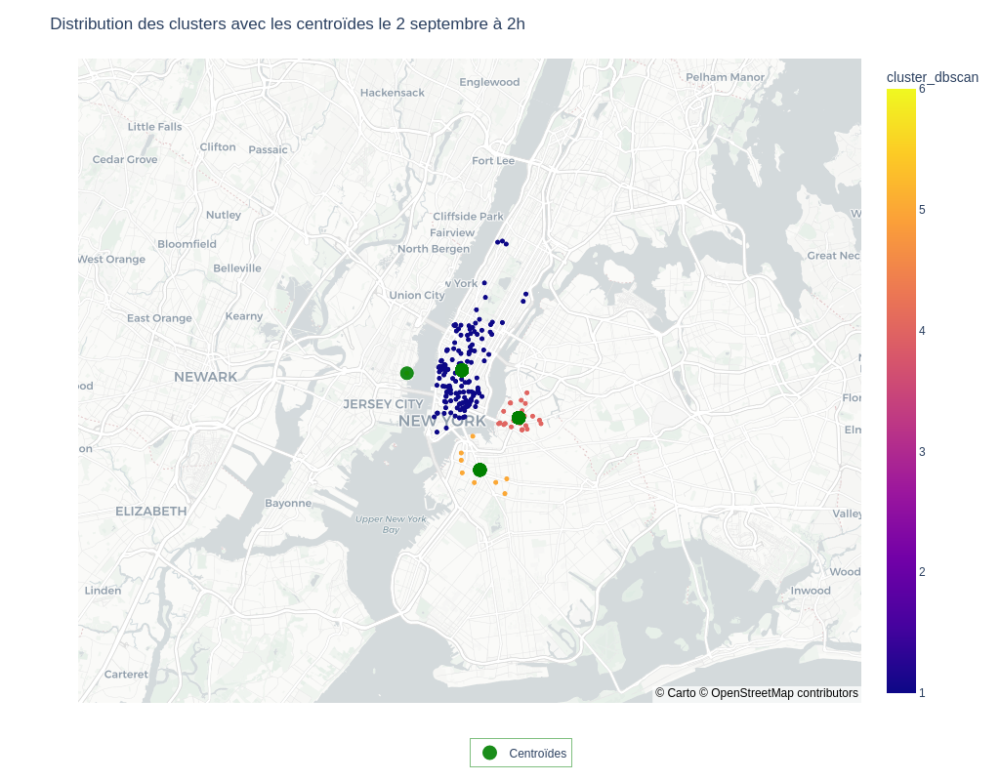

In [59]:
data_with_centroids = get_time_filtered_dbscan_centroids(sep14_sample[sep14_sample['cluster_dbscan'] > 0], 0.005, 39, 2, 2)

display_map_with_centroids(data_with_centroids, "Distribution des clusters avec les centroïdes le 2 septembre à 2h")

## 7. Conclusion

Kmeans et DBSCAN nous ont permis d'identifier des clusters pour les courses Uber.
DBSCAN est plus difficle à paramétrer mais montre des résultats intéressants où l'on peut voir les quartiers de New-York.

Ce que l'on peut conclure est le fait qu'en fonction du jour de la semaine, de l'heure, du quartier et certainement d'autres paramètres comme la météo, les évenements dans la ville ou certainement encore d'autre chose auxquels je ne pense pas, les points chaud bougent en fonction de ces paramètres.

Dans un premier temps je pense qu'il faudrait définir ces points chaud en fonction du jour et de l'heure de la semaine.

On pourrait aussi pour aller plus loin calculer le temps des Ubers pour aller du centre du cluster à la frontière du cluster, pour vérifier que le temps ne soit pas trop long et adpater les clusters en fonction.

Dans un second temps il pourrait être intérressant d'ajouter des paramètres supplémentaires pour que le modèle soit plus précis.